In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from tqdm import tqdm
from pathlib import Path
import matplotlib.pyplot as plt

# Configuration class
class Config:
    """Centralized configuration for the training pipeline."""
    # Data paths
    train_path = './train'
    val_path = './val'
    test_path = './test'
    
    # Model hyperparameters
    input_size = 12288  # 64 * 64 * 3
    hidden1 = 84
    hidden2 = 50
    num_classes = 2
    
    # Training hyperparameters
    batch_size = 64
    learning_rate = 0.001
    epochs = 20
    device = 'mps' if torch.backends.mps.is_available() else 'cpu'
    
    # Data loader settings
    num_workers = 0  # Safe for notebooks
    pin_memory = False
    
    # Model checkpoint
    checkpoint_dir = Path('./checkpoints')
    checkpoint_dir.mkdir(exist_ok=True)
    model_save_path = checkpoint_dir / 'simplenet_best.pth'

config = Config()
print(f"Using device: {config.device}")

Using device: mps


In [12]:
# Data loading function
def get_dataloaders(config):
    """Create train, validation, and test dataloaders."""
    
    # Define transforms
    transform = transforms.Compose([
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
    ])
    
    # Create datasets
    train_dataset = datasets.ImageFolder(root=config.train_path, transform=transform)
    val_dataset = datasets.ImageFolder(root=config.val_path, transform=transform)
    test_dataset = datasets.ImageFolder(root=config.test_path, transform=transform)
    
    # Create dataloaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=config.batch_size,
        shuffle=True,
        num_workers=config.num_workers,
        pin_memory=config.pin_memory
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=config.pin_memory
    )
    
    test_loader = DataLoader(
        test_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=config.pin_memory
    )
    
    print(f"Train samples: {len(train_dataset)}")
    print(f"Val samples: {len(val_dataset)}")
    print(f"Test samples: {len(test_dataset)}")
    print(f"Class names: {train_dataset.classes}")
    
    return train_loader, val_loader, test_loader

train_loader, val_loader, test_loader = get_dataloaders(config)

Train samples: 1023
Val samples: 150
Test samples: 209
Class names: ['cat', 'fish']


# Chapter 4 - Transfer Learning and Other Tricks

## Importing pretrained models
Running a model fine-tune: Alter the architecture slightly to include a new ntework block, then freeze the existing ResNet Layers. Allowing us to quickly train our new layers while preserving the information that the pretrained layers already contain. 

1. First, let's create a pretrained Resnet-50 Model:
2. Next, we need to freeze the layers, the way we do this is simple: we stop them from accumulating gradients by using `requires_grad()` We need to do this for every parameter in the network, but helpfully PyTorch provides a `parameters()` method that makes this rather easy:

- you may not want to freeze the `BatchNorm` layers in a model:

        for name, param in transfer_model.named_parameters():
            if ("bn" not in name):
                param.requires_grad=False

3. We then need to repalce the final classification block with a new one that we will train for our cats/fish model, in this example we replace it with a couple of `Linear` layers, a `ReLU`, and `Dropout`. 
- The definition of PyTorch's implementation of ResNet stores the final classifier block as an instance variable `fc`, so all we need to do is replace that with our new structure.
- We take advantage of the `in_features` variable that allows us to grab the number of activations coming into a layer (2,048) in this case. You can also use `out_features` to discover the activations coming out. if the incoming features on a layer don't match the outgoing features of the previous layer, you'll get an error at runtime. 

In [13]:
from torchvision import models

# import a pretrained ResNet-50 model
transfer_model = models.resnet50(pretrained=True)

# freeze the layers
for name, param in transfer_model.named_parameters():
    param.requires_grad = False

# modify the final layer to match our number of classes
transfer_model.fc = nn.Sequential(nn.Linear(transfer_model.fc.in_features, 500),
                                  nn.ReLU(),
                                  nn.Dropout(0.2),
                                  nn.Linear(500, config.num_classes))

# Move model to the configured device (MPS/CPU)
transfer_model = transfer_model.to(config.device)
print(f"Model moved to {config.device}")

/opt/anaconda3/envs/tfmetal/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/tfmetal/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model moved to mps


Then we go back to our training loop and train the model as per usual:

In [14]:
# Training and evaluation functions with history tracking
class Trainer:
    """Handles model training and evaluation with history tracking."""
    
    def __init__(self, model, config):
        self.model = model
        self.config = config
        self.device = config.device
        
        # Loss and optimizer
        self.criterion = nn.CrossEntropyLoss().to(self.device)
        self.optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
        
        # Learning rate scheduler (reduce on plateau)
        self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, mode='min', factor=0.5, patience=3
        )
        
        # History tracking
        self.history = {
            'train_loss': [],
            'val_loss': [],
            'val_acc': [],
            'lr': []
        }
        
        # Best model tracking
        self.best_val_acc = 0.0
    
    def train_epoch(self, train_loader):
        """Train for one epoch."""
        self.model.train()
        running_loss = 0.0
        
        train_pbar = tqdm(train_loader, desc='Training')
        for inputs, targets in train_pbar:
            inputs = inputs.to(self.device)
            targets = targets.to(self.device)
            
            # Forward pass
            self.optimizer.zero_grad()
            outputs = self.model(inputs)
            loss = self.criterion(outputs, targets)
            
            # Backward pass
            loss.backward()
            self.optimizer.step()
            
            running_loss += loss.item()
            train_pbar.set_postfix({'loss': loss.item()})
        
        return running_loss / len(train_loader)
    
    def validate(self, val_loader):
        """Validate the model."""
        self.model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        
        with torch.no_grad():
            val_pbar = tqdm(val_loader, desc='Validating')
            for inputs, targets in val_pbar:
                inputs = inputs.to(self.device)
                targets = targets.to(self.device)
                
                outputs = self.model(inputs)
                loss = self.criterion(outputs, targets)
                
                running_loss += loss.item()
                
                # Calculate accuracy
                _, predicted = torch.max(outputs, 1)
                total += targets.size(0)
                correct += (predicted == targets).sum().item()
                
                val_pbar.set_postfix({'loss': loss.item(), 'acc': correct/total})
        
        val_loss = running_loss / len(val_loader)
        val_acc = correct / total
        
        return val_loss, val_acc
    
    def fit(self, train_loader, val_loader, epochs):
        """Train the model for multiple epochs."""
        print(f"\nStarting training for {epochs} epochs...")
        print(f"{'='*60}\n")
        
        for epoch in range(epochs):
            print(f"Epoch {epoch+1}/{epochs}")
            
            # Train
            train_loss = self.train_epoch(train_loader)
            
            # Validate
            val_loss, val_acc = self.validate(val_loader)
            
            # Update learning rate scheduler
            self.scheduler.step(val_loss)
            
            # Get current learning rate
            current_lr = self.optimizer.param_groups[0]['lr']
            
            # Update history
            self.history['train_loss'].append(train_loss)
            self.history['val_loss'].append(val_loss)
            self.history['val_acc'].append(val_acc)
            self.history['lr'].append(current_lr)
            
            # Save best model
            if val_acc > self.best_val_acc:
                self.best_val_acc = val_acc
                self.save_checkpoint()
                print(f"✓ New best model saved! Val Acc: {val_acc:.4f}")
            
            # Print epoch summary
            print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | LR: {current_lr:.6f}")
            print(f"{'='*60}\n")
        
        print(f"Training complete! Best Val Acc: {self.best_val_acc:.4f}")
        return self.history
    
    def evaluate(self, test_loader):
        """Evaluate on test set."""
        self.model.eval()
        correct = 0
        total = 0
        
        with torch.no_grad():
            test_pbar = tqdm(test_loader, desc='Testing')
            for inputs, targets in test_pbar:
                inputs = inputs.to(self.device)
                targets = targets.to(self.device)
                
                outputs = self.model(inputs)
                _, predicted = torch.max(outputs, 1)
                
                total += targets.size(0)
                correct += (predicted == targets).sum().item()
                
                test_pbar.set_postfix({'acc': correct/total})
        
        test_acc = correct / total
        
        print(f"\n{'='*60}")
        print(f"Test Set Evaluation")
        print(f"{'='*60}")
        print(f"Total Examples: {total}")
        print(f"Correct Predictions: {correct}")
        print(f"Test Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")
        print(f"{'='*60}\n")
        
        return test_acc
    
    def save_checkpoint(self):
        """Save model checkpoint."""
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'best_val_acc': self.best_val_acc,
            'history': self.history,
        }, self.config.model_save_path)
    
    def load_checkpoint(self):
        """Load model checkpoint."""
        checkpoint = torch.load(self.config.model_save_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        self.best_val_acc = checkpoint['best_val_acc']
        self.history = checkpoint['history']
        print(f"Loaded checkpoint with Val Acc: {self.best_val_acc:.4f}")

# Create trainer
trainer = Trainer(transfer_model, config)

# Train the model
history = trainer.fit(train_loader, val_loader, epochs=config.epochs)


Starting training for 20 epochs...

Epoch 1/20


Validating: 100%|██████████| 3/3 [00:01<00:00,  2.44it/s, loss=0.499, acc=0.833]


✓ New best model saved! Val Acc: 0.8333
Train Loss: 0.7478 | Val Loss: 0.4522 | Val Acc: 0.8333 | LR: 0.001000

Epoch 2/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.41it/s, loss=0.127, acc=0.793]


Train Loss: 0.3934 | Val Loss: 0.3735 | Val Acc: 0.7933 | LR: 0.001000

Epoch 3/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.24it/s, loss=0.417, acc=0.853]


✓ New best model saved! Val Acc: 0.8533
Train Loss: 0.3481 | Val Loss: 0.3453 | Val Acc: 0.8533 | LR: 0.001000

Epoch 4/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.39it/s, loss=0.0677, acc=0.727]


Train Loss: 0.3373 | Val Loss: 0.4775 | Val Acc: 0.7267 | LR: 0.001000

Epoch 5/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.40it/s, loss=0.169, acc=0.827]


Train Loss: 0.2891 | Val Loss: 0.3173 | Val Acc: 0.8267 | LR: 0.001000

Epoch 6/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.41it/s, loss=0.261, acc=0.847]


Train Loss: 0.2521 | Val Loss: 0.3039 | Val Acc: 0.8467 | LR: 0.001000

Epoch 7/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.29it/s, loss=0.199, acc=0.84] 


Train Loss: 0.2359 | Val Loss: 0.2938 | Val Acc: 0.8400 | LR: 0.001000

Epoch 8/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.23it/s, loss=0.124, acc=0.84] 


Train Loss: 0.2301 | Val Loss: 0.3401 | Val Acc: 0.8400 | LR: 0.001000

Epoch 9/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.33it/s, loss=0.124, acc=0.807]


Train Loss: 0.2143 | Val Loss: 0.3559 | Val Acc: 0.8067 | LR: 0.001000

Epoch 10/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.278, acc=0.847]


Train Loss: 0.2222 | Val Loss: 0.3205 | Val Acc: 0.8467 | LR: 0.001000

Epoch 11/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.273, acc=0.847]


Train Loss: 0.1798 | Val Loss: 0.3340 | Val Acc: 0.8467 | LR: 0.000500

Epoch 12/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.28it/s, loss=0.272, acc=0.853]


Train Loss: 0.1834 | Val Loss: 0.3428 | Val Acc: 0.8533 | LR: 0.000500

Epoch 13/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.34it/s, loss=0.187, acc=0.84] 


Train Loss: 0.1617 | Val Loss: 0.3361 | Val Acc: 0.8400 | LR: 0.000500

Epoch 14/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s, loss=0.147, acc=0.813]


Train Loss: 0.1369 | Val Loss: 0.3478 | Val Acc: 0.8133 | LR: 0.000500

Epoch 15/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.29it/s, loss=0.425, acc=0.86] 


✓ New best model saved! Val Acc: 0.8600
Train Loss: 0.1531 | Val Loss: 0.3533 | Val Acc: 0.8600 | LR: 0.000250

Epoch 16/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.33it/s, loss=0.186, acc=0.82] 


Train Loss: 0.1775 | Val Loss: 0.3286 | Val Acc: 0.8200 | LR: 0.000250

Epoch 17/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.186, acc=0.807]


Train Loss: 0.1435 | Val Loss: 0.3422 | Val Acc: 0.8067 | LR: 0.000250

Epoch 18/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.32it/s, loss=0.19, acc=0.813] 


Train Loss: 0.1183 | Val Loss: 0.3340 | Val Acc: 0.8133 | LR: 0.000250

Epoch 19/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.24it/s, loss=0.197, acc=0.82] 


Train Loss: 0.1287 | Val Loss: 0.3318 | Val Acc: 0.8200 | LR: 0.000125

Epoch 20/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s, loss=0.191, acc=0.813]

Train Loss: 0.1270 | Val Loss: 0.3275 | Val Acc: 0.8133 | LR: 0.000125

Training complete! Best Val Acc: 0.8600


let's try again with the batchnorm unfreeze:

In [16]:
# import a pretrained ResNet-50 model
transfer_model = models.resnet50(pretrained=True)

# freeze the layers
for name, param in transfer_model.named_parameters():
    if ('bn' not in name):  # Unfreeze batchnorm layers
        param.requires_grad = False

# modify the final layer to match our number of classes
transfer_model.fc = nn.Sequential(nn.Linear(transfer_model.fc.in_features, 500),
                                  nn.ReLU(),
                                  nn.Dropout(0.2),
                                  nn.Linear(500, config.num_classes))

# Move model to the configured device (MPS/CPU)
transfer_model = transfer_model.to(config.device)
print(f"Model moved to {config.device}")

history = trainer.fit(train_loader, val_loader, epochs=config.epochs)

/opt/anaconda3/envs/tfmetal/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/tfmetal/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model moved to mps

Starting training for 20 epochs...

Epoch 1/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.35it/s, loss=0.198, acc=0.813]


Train Loss: 0.1129 | Val Loss: 0.3321 | Val Acc: 0.8133 | LR: 0.000125

Epoch 2/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.237, acc=0.82] 


Train Loss: 0.1280 | Val Loss: 0.3343 | Val Acc: 0.8200 | LR: 0.000125

Epoch 3/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.197, acc=0.813]


Train Loss: 0.1191 | Val Loss: 0.3314 | Val Acc: 0.8133 | LR: 0.000063

Epoch 4/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.33it/s, loss=0.183, acc=0.8]  


Train Loss: 0.1148 | Val Loss: 0.3409 | Val Acc: 0.8000 | LR: 0.000063

Epoch 5/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.28it/s, loss=0.211, acc=0.827]


Train Loss: 0.1123 | Val Loss: 0.3253 | Val Acc: 0.8267 | LR: 0.000063

Epoch 6/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.27it/s, loss=0.193, acc=0.793]


Train Loss: 0.1125 | Val Loss: 0.3383 | Val Acc: 0.7933 | LR: 0.000063

Epoch 7/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s, loss=0.177, acc=0.807]


Train Loss: 0.1053 | Val Loss: 0.3434 | Val Acc: 0.8067 | LR: 0.000031

Epoch 8/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.203, acc=0.813]


Train Loss: 0.0984 | Val Loss: 0.3283 | Val Acc: 0.8133 | LR: 0.000031

Epoch 9/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s, loss=0.202, acc=0.82] 


Train Loss: 0.1044 | Val Loss: 0.3268 | Val Acc: 0.8200 | LR: 0.000031

Epoch 10/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.29it/s, loss=0.184, acc=0.813]


Train Loss: 0.1029 | Val Loss: 0.3380 | Val Acc: 0.8133 | LR: 0.000031

Epoch 11/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.23it/s, loss=0.196, acc=0.813]


Train Loss: 0.1050 | Val Loss: 0.3350 | Val Acc: 0.8133 | LR: 0.000016

Epoch 12/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.21it/s, loss=0.184, acc=0.813]


Train Loss: 0.1015 | Val Loss: 0.3235 | Val Acc: 0.8133 | LR: 0.000016

Epoch 13/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.21it/s, loss=0.197, acc=0.84] 


Train Loss: 0.1049 | Val Loss: 0.3208 | Val Acc: 0.8400 | LR: 0.000016

Epoch 14/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.32it/s, loss=0.19, acc=0.8]   


Train Loss: 0.1039 | Val Loss: 0.3417 | Val Acc: 0.8000 | LR: 0.000016

Epoch 15/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.17, acc=0.82]  


Train Loss: 0.1061 | Val Loss: 0.3336 | Val Acc: 0.8200 | LR: 0.000008

Epoch 16/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.28it/s, loss=0.186, acc=0.82] 


Train Loss: 0.1109 | Val Loss: 0.3331 | Val Acc: 0.8200 | LR: 0.000008

Epoch 17/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.41it/s, loss=0.191, acc=0.82] 


Train Loss: 0.1071 | Val Loss: 0.3358 | Val Acc: 0.8200 | LR: 0.000008

Epoch 18/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.36it/s, loss=0.212, acc=0.84] 


Train Loss: 0.0990 | Val Loss: 0.3234 | Val Acc: 0.8400 | LR: 0.000008

Epoch 19/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.34it/s, loss=0.211, acc=0.807]


Train Loss: 0.1042 | Val Loss: 0.3282 | Val Acc: 0.8067 | LR: 0.000004

Epoch 20/20


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.36it/s, loss=0.192, acc=0.813]

Train Loss: 0.1071 | Val Loss: 0.3282 | Val Acc: 0.8133 | LR: 0.000004

Training complete! Best Val Acc: 0.8600


## Finding that Learning Rate
Cyclical Learning Rates for Training Nerual Networks a la fast.ai

Whats going on here is that:
- we iterate through the batches, training almost as usual,
- we pass our inputs through the model and then we get the loss from that batch.
- We record what our `best_loss` is so far, and compare the new loss against it
- If our new loss is more than four times the `best_loss`, we crashout of the function, returning what we have so far (as the loss is probably tending to inifinity).
- Otherwise, we keep appending the loss and logs of teh current learning rate, and update the learning rate with the next step along the way at the end of the loop. The plot can then be shown using the `matplotlibplt` function:

        logs, losses = find_lr()
        plt.plot(logs, losses)

In [22]:
import math

def find_lr(model, loss_fn, optimizer, train_loader, device, init_value=1e-8, final_value=10.0):
    """Find optimal learning rate using cyclical learning rates.
    
    Args:
        model: The neural network model
        loss_fn: Loss function
        optimizer: Optimizer (will be modified)
        train_loader: Training data loader
        device: Device to run on (e.g., 'mps', 'cuda', 'cpu')
        init_value: Starting learning rate (default: 1e-8)
        final_value: Final learning rate (default: 10.0)
    
    Returns:
        log_lrs: List of log10(learning_rate) values
        losses: List of corresponding loss values
    """
    number_in_epoch = len(train_loader) - 1
    update_step = (final_value / init_value) ** (1 / number_in_epoch)
    lr = init_value
    optimizer.param_groups[0]['lr'] = lr
    best_loss = 0.0
    batch_num = 0
    losses = []
    log_lrs = []
    
    model.train()
    
    for data in train_loader:
        batch_num += 1
        inputs, labels = data
        # Move to device
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = loss_fn(outputs, labels)

        # Crash out if loss explodes
        if batch_num > 1 and loss.item() > 4 * best_loss:
            return log_lrs[10:-5], losses[10:-5]
        
        # Record the best loss
        if loss.item() < best_loss or batch_num == 1:
            best_loss = loss.item()
        
        # Store the values
        losses.append(loss.item())
        log_lrs.append(math.log10(lr))
        
        # Do the backward pass and optimize
        loss.backward()
        optimizer.step()
        
        # Update the lr for the next step
        lr *= update_step
        optimizer.param_groups[0]['lr'] = lr
    
    return log_lrs[10:-5], losses[10:-5]

Running learning rate finder...
This will take a few minutes as it sweeps through different learning rates.



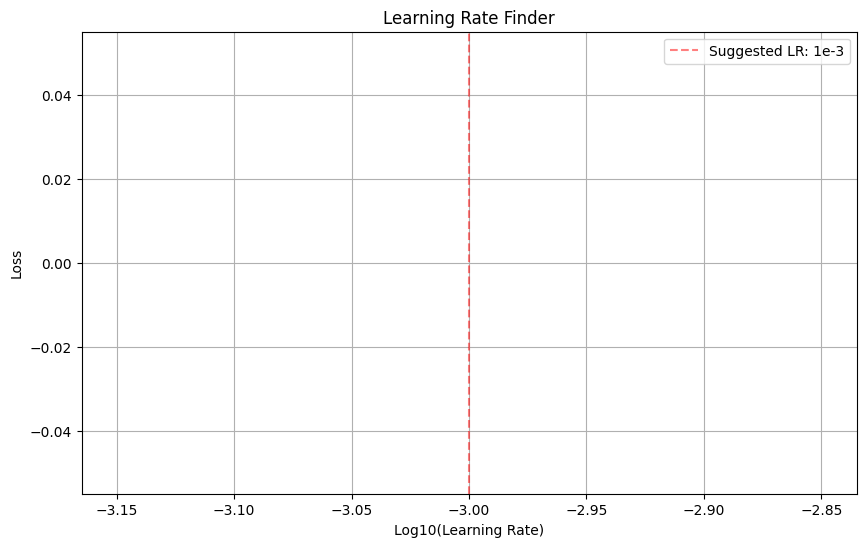


How to read this plot:
- Look for the steepest downward slope (where loss decreases fastest)
- Choose a learning rate slightly before the minimum loss
- Typical good range: where the slope is steepest
- Avoid the flat region (too small) and the rising region (too large)

Suggested learning rate: ~1e-3 (where the red line is)


In [23]:
# Run the learning rate finder
print("Running learning rate finder...")
print("This will take a few minutes as it sweeps through different learning rates.\n")

# Create a fresh model for LR finding
lr_finder_model = models.resnet50(weights='IMAGENET1K_V1')
for name, param in lr_finder_model.named_parameters():
    param.requires_grad = False

lr_finder_model.fc = nn.Sequential(
    nn.Linear(lr_finder_model.fc.in_features, 500),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(500, config.num_classes)
)
lr_finder_model = lr_finder_model.to(config.device)

# Create optimizer and loss function for LR finder
lr_optimizer = optim.Adam(lr_finder_model.parameters(), lr=1e-8)
lr_loss_fn = nn.CrossEntropyLoss()

# Run the LR finder
log_lrs, losses = find_lr(
    model=lr_finder_model,
    loss_fn=lr_loss_fn,
    optimizer=lr_optimizer,
    train_loader=train_loader,
    device=config.device,
    init_value=1e-8,
    final_value=10.0
)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(log_lrs, losses)
plt.xlabel('Log10(Learning Rate)')
plt.ylabel('Loss')
plt.title('Learning Rate Finder')
plt.grid(True)
plt.axvline(x=-3, color='r', linestyle='--', alpha=0.5, label='Suggested LR: 1e-3')
plt.legend()
plt.show()

print("\nHow to read this plot:")
print("- Look for the steepest downward slope (where loss decreases fastest)")
print("- Choose a learning rate slightly before the minimum loss")
print("- Typical good range: where the slope is steepest")
print("- Avoid the flat region (too small) and the rising region (too large)")
print("\nSuggested learning rate: ~1e-3 (where the red line is)")

## Enhanced Trainer with OneCycleLR

Now let's create an enhanced trainer that supports **OneCycleLR** - a cyclical learning rate scheduler that:
- Starts with a low LR and warms up to a max LR
- Then anneals back down to a very low LR
- Can go UP and DOWN during training (unlike ReduceLROnPlateau which only goes down)
- Often trains faster and achieves better results

In [24]:
# Enhanced Trainer with flexible LR scheduler support
class EnhancedTrainer:
    """Handles model training with support for multiple LR schedulers."""
    
    def __init__(self, model, config, scheduler_type='onecycle', max_lr=1e-3):
        """
        Args:
            model: The neural network model
            config: Configuration object
            scheduler_type: 'onecycle', 'plateau', or 'cyclic'
            max_lr: Maximum learning rate for cyclical schedulers
        """
        self.model = model
        self.config = config
        self.device = config.device
        self.scheduler_type = scheduler_type
        
        # Loss and optimizer
        self.criterion = nn.CrossEntropyLoss().to(self.device)
        self.optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
        
        # Learning rate scheduler
        self.scheduler = None
        self.max_lr = max_lr
        
        # History tracking
        self.history = {
            'train_loss': [],
            'val_loss': [],
            'val_acc': [],
            'lr': []
        }
        
        # Best model tracking
        self.best_val_acc = 0.0
    
    def setup_scheduler(self, train_loader, epochs):
        """Setup the learning rate scheduler based on type."""
        if self.scheduler_type == 'onecycle':
            # OneCycleLR: single cycle with warmup and annealing
            self.scheduler = optim.lr_scheduler.OneCycleLR(
                self.optimizer,
                max_lr=self.max_lr,
                steps_per_epoch=len(train_loader),
                epochs=epochs,
                pct_start=0.3,  # 30% of training for warmup
                div_factor=25.0,  # initial_lr = max_lr / 25
                final_div_factor=10000.0  # min_lr = initial_lr / 10000
            )
            self.step_per_batch = True
            print(f"Using OneCycleLR scheduler (max_lr={self.max_lr})")
            
        elif self.scheduler_type == 'cyclic':
            # CyclicLR: continuous cycles between min and max LR
            self.scheduler = optim.lr_scheduler.CyclicLR(
                self.optimizer,
                base_lr=self.max_lr / 10,
                max_lr=self.max_lr,
                step_size_up=len(train_loader) * 2,  # 2 epochs up, 2 epochs down
                mode='triangular2'
            )
            self.step_per_batch = True
            print(f"Using CyclicLR scheduler (base_lr={self.max_lr/10}, max_lr={self.max_lr})")
            
        elif self.scheduler_type == 'plateau':
            # ReduceLROnPlateau: reduce when validation loss plateaus
            self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                self.optimizer, mode='min', factor=0.5, patience=3
            )
            self.step_per_batch = False
            print("Using ReduceLROnPlateau scheduler")
            
        else:
            print("No scheduler - using constant learning rate")
            self.step_per_batch = False
    
    def train_epoch(self, train_loader):
        """Train for one epoch."""
        self.model.train()
        running_loss = 0.0
        
        train_pbar = tqdm(train_loader, desc='Training')
        for inputs, targets in train_pbar:
            inputs = inputs.to(self.device)
            targets = targets.to(self.device)
            
            # Forward pass
            self.optimizer.zero_grad()
            outputs = self.model(inputs)
            loss = self.criterion(outputs, targets)
            
            # Backward pass
            loss.backward()
            self.optimizer.step()
            
            # Step scheduler if per-batch (OneCycle, Cyclic)
            if self.scheduler and self.step_per_batch:
                self.scheduler.step()
            
            running_loss += loss.item()
            current_lr = self.optimizer.param_groups[0]['lr']
            train_pbar.set_postfix({'loss': loss.item(), 'lr': f'{current_lr:.6f}'})
        
        return running_loss / len(train_loader)
    
    def validate(self, val_loader):
        """Validate the model."""
        self.model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        
        with torch.no_grad():
            val_pbar = tqdm(val_loader, desc='Validating')
            for inputs, targets in val_pbar:
                inputs = inputs.to(self.device)
                targets = targets.to(self.device)
                
                outputs = self.model(inputs)
                loss = self.criterion(outputs, targets)
                
                running_loss += loss.item()
                
                # Calculate accuracy
                _, predicted = torch.max(outputs, 1)
                total += targets.size(0)
                correct += (predicted == targets).sum().item()
                
                val_pbar.set_postfix({'loss': loss.item(), 'acc': correct/total})
        
        val_loss = running_loss / len(val_loader)
        val_acc = correct / total
        
        return val_loss, val_acc
    
    def fit(self, train_loader, val_loader, epochs):
        """Train the model for multiple epochs."""
        # Setup scheduler with train_loader info
        self.setup_scheduler(train_loader, epochs)
        
        print(f"\nStarting training for {epochs} epochs...")
        print(f"{'='*60}\n")
        
        for epoch in range(epochs):
            print(f"Epoch {epoch+1}/{epochs}")
            
            # Train
            train_loss = self.train_epoch(train_loader)
            
            # Validate
            val_loss, val_acc = self.validate(val_loader)
            
            # Step scheduler if per-epoch (Plateau)
            if self.scheduler and not self.step_per_batch:
                self.scheduler.step(val_loss)
            
            # Get current learning rate
            current_lr = self.optimizer.param_groups[0]['lr']
            
            # Update history
            self.history['train_loss'].append(train_loss)
            self.history['val_loss'].append(val_loss)
            self.history['val_acc'].append(val_acc)
            self.history['lr'].append(current_lr)
            
            # Save best model
            if val_acc > self.best_val_acc:
                self.best_val_acc = val_acc
                self.save_checkpoint()
                print(f"✓ New best model saved! Val Acc: {val_acc:.4f}")
            
            # Print epoch summary
            print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | LR: {current_lr:.6f}")
            print(f"{'='*60}\n")
        
        print(f"Training complete! Best Val Acc: {self.best_val_acc:.4f}")
        return self.history
    
    def plot_history(self):
        """Plot training history including learning rate schedule."""
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        
        # Plot loss
        axes[0, 0].plot(self.history['train_loss'], label='Train Loss')
        axes[0, 0].plot(self.history['val_loss'], label='Val Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].set_title('Training and Validation Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True)
        
        # Plot accuracy
        axes[0, 1].plot(self.history['val_acc'], label='Val Accuracy', color='green')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Accuracy')
        axes[0, 1].set_title('Validation Accuracy')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
        
        # Plot learning rate
        axes[1, 0].plot(self.history['lr'], label='Learning Rate', color='orange')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Learning Rate')
        axes[1, 0].set_title('Learning Rate Schedule')
        axes[1, 0].set_yscale('log')
        axes[1, 0].legend()
        axes[1, 0].grid(True)
        
        # Plot loss vs LR (useful for diagnosing LR issues)
        axes[1, 1].scatter(self.history['lr'], self.history['train_loss'], alpha=0.6)
        axes[1, 1].set_xlabel('Learning Rate')
        axes[1, 1].set_ylabel('Training Loss')
        axes[1, 1].set_title('Loss vs Learning Rate')
        axes[1, 1].set_xscale('log')
        axes[1, 1].grid(True)
        
        plt.tight_layout()
        plt.show()
    
    def evaluate(self, test_loader):
        """Evaluate on test set."""
        self.model.eval()
        correct = 0
        total = 0
        
        with torch.no_grad():
            test_pbar = tqdm(test_loader, desc='Testing')
            for inputs, targets in test_pbar:
                inputs = inputs.to(self.device)
                targets = targets.to(self.device)
                
                outputs = self.model(inputs)
                _, predicted = torch.max(outputs, 1)
                
                total += targets.size(0)
                correct += (predicted == targets).sum().item()
                
                test_pbar.set_postfix({'acc': correct/total})
        
        test_acc = correct / total
        
        print(f"\n{'='*60}")
        print(f"Test Set Evaluation")
        print(f"{'='*60}")
        print(f"Total Examples: {total}")
        print(f"Correct Predictions: {correct}")
        print(f"Test Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")
        print(f"{'='*60}\n")
        
        return test_acc
    
    def save_checkpoint(self):
        """Save model checkpoint."""
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'best_val_acc': self.best_val_acc,
            'history': self.history,
        }, self.config.model_save_path)
    
    def load_checkpoint(self):
        """Load model checkpoint."""
        checkpoint = torch.load(self.config.model_save_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        self.best_val_acc = checkpoint['best_val_acc']
        self.history = checkpoint['history']
        print(f"Loaded checkpoint with Val Acc: {self.best_val_acc:.4f}")

Training with OneCycleLR scheduler

Using OneCycleLR scheduler (max_lr=0.001)

Starting training for 10 epochs...

Epoch 1/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.42it/s, loss=0.338, acc=0.813]


✓ New best model saved! Val Acc: 0.8133
Train Loss: 0.5935 | Val Loss: 0.4164 | Val Acc: 0.8133 | LR: 0.000289

Epoch 2/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.37it/s, loss=0.171, acc=0.847]


✓ New best model saved! Val Acc: 0.8467
Train Loss: 0.3609 | Val Loss: 0.2823 | Val Acc: 0.8467 | LR: 0.000778

Epoch 3/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.35it/s, loss=0.373, acc=0.847]


Train Loss: 0.2741 | Val Loss: 0.3402 | Val Acc: 0.8467 | LR: 0.001000

Epoch 4/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.35it/s, loss=0.126, acc=0.813]


Train Loss: 0.2871 | Val Loss: 0.3876 | Val Acc: 0.8133 | LR: 0.000944

Epoch 5/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.33it/s, loss=0.221, acc=0.827]


Train Loss: 0.2475 | Val Loss: 0.3458 | Val Acc: 0.8267 | LR: 0.000801

Epoch 6/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.35it/s, loss=0.227, acc=0.833]


Train Loss: 0.1783 | Val Loss: 0.3489 | Val Acc: 0.8333 | LR: 0.000598

Epoch 7/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.36it/s, loss=0.388, acc=0.84] 


Train Loss: 0.1865 | Val Loss: 0.3549 | Val Acc: 0.8400 | LR: 0.000375

Epoch 8/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.33it/s, loss=0.226, acc=0.82] 


Train Loss: 0.1401 | Val Loss: 0.3695 | Val Acc: 0.8200 | LR: 0.000177

Epoch 9/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.33it/s, loss=0.291, acc=0.847]


Train Loss: 0.1268 | Val Loss: 0.3598 | Val Acc: 0.8467 | LR: 0.000044

Epoch 10/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.35it/s, loss=0.333, acc=0.84] 


Train Loss: 0.1290 | Val Loss: 0.3646 | Val Acc: 0.8400 | LR: 0.000000

Training complete! Best Val Acc: 0.8467


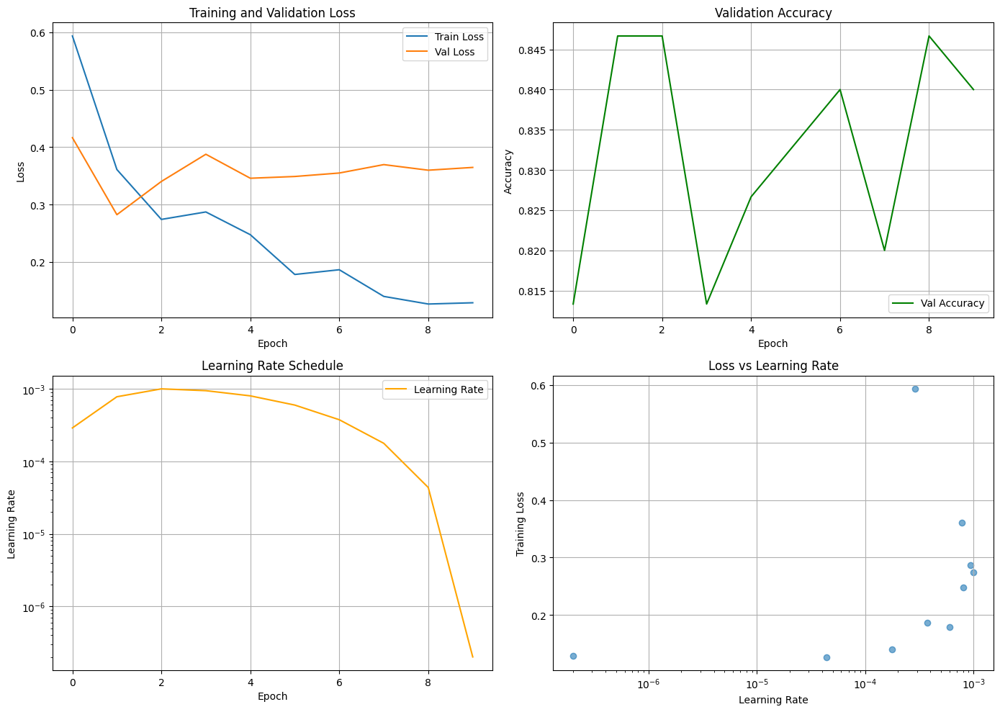

Testing: 100%|██████████| 4/4 [00:01<00:00,  2.44it/s, acc=0.876]


Test Set Evaluation
Total Examples: 209
Correct Predictions: 183
Test Accuracy: 0.8756 (87.56%)



In [25]:
# Example: Train with OneCycleLR
print("Training with OneCycleLR scheduler\n")

# Create a fresh model
onecycle_model = models.resnet50(weights='IMAGENET1K_V1')
for name, param in onecycle_model.named_parameters():
    param.requires_grad = False

onecycle_model.fc = nn.Sequential(
    nn.Linear(onecycle_model.fc.in_features, 500),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(500, config.num_classes)
)
onecycle_model = onecycle_model.to(config.device)

# Create trainer with OneCycleLR
# Use max_lr from the LR finder (around 1e-3)
onecycle_trainer = EnhancedTrainer(
    model=onecycle_model,
    config=config,
    scheduler_type='onecycle',
    max_lr=1e-3  # Adjust this based on your LR finder results
)

# Train the model
onecycle_history = onecycle_trainer.fit(train_loader, val_loader, epochs=10)

# Plot the training history
onecycle_trainer.plot_history()

# Evaluate on test set
test_acc = onecycle_trainer.evaluate(test_loader)

### Comparing Different LR Schedulers

You can experiment with different schedulers to see which works best for your problem:

1. **OneCycleLR** - Single cycle, good for fast training
2. **CyclicLR** - Continuous cycles, can help escape local minima
3. **ReduceLROnPlateau** - Classic approach, reduces LR when stuck


Testing onecycle scheduler

Using OneCycleLR scheduler (max_lr=0.001)

Starting training for 10 epochs...

Epoch 1/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.35it/s, loss=0.399, acc=0.847]


✓ New best model saved! Val Acc: 0.8467
Train Loss: 0.6197 | Val Loss: 0.4276 | Val Acc: 0.8467 | LR: 0.000289

Epoch 2/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.24it/s, loss=0.113, acc=0.813]


Train Loss: 0.3912 | Val Loss: 0.3450 | Val Acc: 0.8133 | LR: 0.000778

Epoch 3/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.16it/s, loss=0.0961, acc=0.8] 


Train Loss: 0.3104 | Val Loss: 0.3404 | Val Acc: 0.8000 | LR: 0.001000

Epoch 4/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.183, acc=0.82] 


Train Loss: 0.2447 | Val Loss: 0.3004 | Val Acc: 0.8200 | LR: 0.000944

Epoch 5/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.26it/s, loss=0.33, acc=0.847] 


Train Loss: 0.2177 | Val Loss: 0.3204 | Val Acc: 0.8467 | LR: 0.000801

Epoch 6/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.151, acc=0.813]


Train Loss: 0.1791 | Val Loss: 0.3599 | Val Acc: 0.8133 | LR: 0.000598

Epoch 7/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.135, acc=0.8]  


Train Loss: 0.1453 | Val Loss: 0.3427 | Val Acc: 0.8000 | LR: 0.000375

Epoch 8/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.34it/s, loss=0.11, acc=0.807]


Train Loss: 0.1452 | Val Loss: 0.3824 | Val Acc: 0.8067 | LR: 0.000177

Epoch 9/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.32it/s, loss=0.239, acc=0.853]


✓ New best model saved! Val Acc: 0.8533
Train Loss: 0.1260 | Val Loss: 0.3125 | Val Acc: 0.8533 | LR: 0.000044

Epoch 10/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.201, acc=0.84] 


Train Loss: 0.1097 | Val Loss: 0.3203 | Val Acc: 0.8400 | LR: 0.000000

Training complete! Best Val Acc: 0.8533

Testing plateau scheduler

Using ReduceLROnPlateau scheduler

Starting training for 10 epochs...

Epoch 1/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.25it/s, loss=0.162, acc=0.853]


✓ New best model saved! Val Acc: 0.8533
Train Loss: 0.5776 | Val Loss: 0.3608 | Val Acc: 0.8533 | LR: 0.001000

Epoch 2/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s, loss=0.679, acc=0.847]


Train Loss: 0.3273 | Val Loss: 0.4159 | Val Acc: 0.8467 | LR: 0.001000

Epoch 3/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.33it/s, loss=0.0829, acc=0.793]


Train Loss: 0.3178 | Val Loss: 0.3799 | Val Acc: 0.7933 | LR: 0.001000

Epoch 4/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.204, acc=0.833]


Train Loss: 0.2511 | Val Loss: 0.2972 | Val Acc: 0.8333 | LR: 0.001000

Epoch 5/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.32it/s, loss=0.13, acc=0.82]  


Train Loss: 0.2369 | Val Loss: 0.3263 | Val Acc: 0.8200 | LR: 0.001000

Epoch 6/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.08it/s, loss=0.357, acc=0.84] 


Train Loss: 0.1984 | Val Loss: 0.3437 | Val Acc: 0.8400 | LR: 0.001000

Epoch 7/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.28it/s, loss=0.324, acc=0.833]


Train Loss: 0.2047 | Val Loss: 0.3167 | Val Acc: 0.8333 | LR: 0.001000

Epoch 8/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.19it/s, loss=0.193, acc=0.773]


Train Loss: 0.1547 | Val Loss: 0.3520 | Val Acc: 0.7733 | LR: 0.000500

Epoch 9/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.17it/s, loss=0.276, acc=0.867]


✓ New best model saved! Val Acc: 0.8667
Train Loss: 0.1331 | Val Loss: 0.3142 | Val Acc: 0.8667 | LR: 0.000500

Epoch 10/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.26it/s, loss=0.337, acc=0.867]


Train Loss: 0.1487 | Val Loss: 0.3190 | Val Acc: 0.8667 | LR: 0.000500

Training complete! Best Val Acc: 0.8667

Testing cyclic scheduler

Using CyclicLR scheduler (base_lr=0.0001, max_lr=0.001)

Starting training for 10 epochs...

Epoch 1/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s, loss=0.0946, acc=0.753]


✓ New best model saved! Val Acc: 0.7533
Train Loss: 0.5242 | Val Loss: 0.4251 | Val Acc: 0.7533 | LR: 0.000550

Epoch 2/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.24it/s, loss=0.304, acc=0.833]


✓ New best model saved! Val Acc: 0.8333
Train Loss: 0.3520 | Val Loss: 0.3429 | Val Acc: 0.8333 | LR: 0.001000

Epoch 3/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.0865, acc=0.773]


Train Loss: 0.3398 | Val Loss: 0.4506 | Val Acc: 0.7733 | LR: 0.000550

Epoch 4/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.27it/s, loss=0.231, acc=0.827]


Train Loss: 0.2235 | Val Loss: 0.3384 | Val Acc: 0.8267 | LR: 0.000100

Epoch 5/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.29it/s, loss=0.296, acc=0.84] 


✓ New best model saved! Val Acc: 0.8400
Train Loss: 0.2114 | Val Loss: 0.3341 | Val Acc: 0.8400 | LR: 0.000325

Epoch 6/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.29it/s, loss=0.221, acc=0.807]


Train Loss: 0.2447 | Val Loss: 0.3452 | Val Acc: 0.8067 | LR: 0.000550

Epoch 7/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s, loss=0.424, acc=0.84] 


Train Loss: 0.2427 | Val Loss: 0.3539 | Val Acc: 0.8400 | LR: 0.000325

Epoch 8/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s, loss=0.361, acc=0.833]


Train Loss: 0.1803 | Val Loss: 0.3415 | Val Acc: 0.8333 | LR: 0.000100

Epoch 9/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.24it/s, loss=0.239, acc=0.827]


Train Loss: 0.1574 | Val Loss: 0.3258 | Val Acc: 0.8267 | LR: 0.000213

Epoch 10/10


Validating: 100%|██████████| 3/3 [00:00<00:00,  3.28it/s, loss=0.231, acc=0.827]

Train Loss: 0.1717 | Val Loss: 0.3187 | Val Acc: 0.8267 | LR: 0.000325

Training complete! Best Val Acc: 0.8400


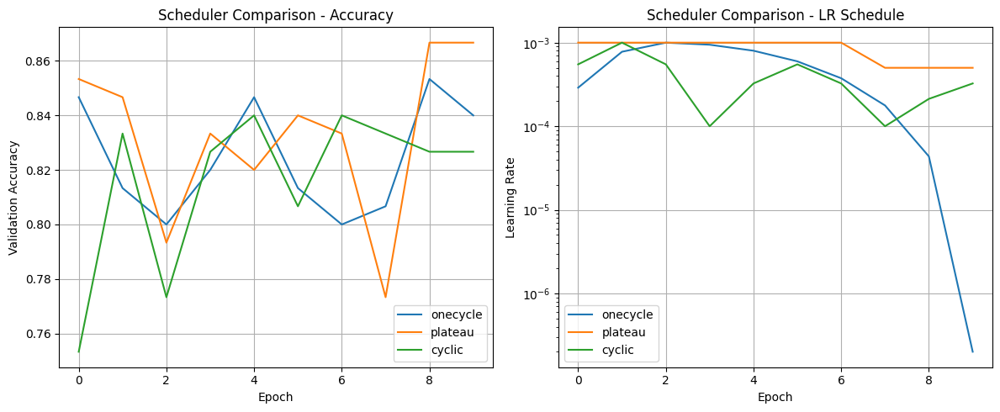


Final Results:
onecycle: 0.8533
plateau: 0.8667
cyclic: 0.8400
Scheduler comparison code ready (uncomment to run)


In [26]:
# Quick comparison of schedulers (commented out to avoid long training time)
# Uncomment to run a comparison experiment


# Compare OneCycleLR vs ReduceLROnPlateau
schedulers_to_test = ['onecycle', 'plateau', 'cyclic']
results = {}

for sched_type in schedulers_to_test:
    print(f"\n{'='*60}")
    print(f"Testing {sched_type} scheduler")
    print(f"{'='*60}\n")
    
    # Create fresh model
    test_model = models.resnet50(weights='IMAGENET1K_V1')
    for param in test_model.parameters():
        param.requires_grad = False
    
    test_model.fc = nn.Sequential(
        nn.Linear(test_model.fc.in_features, 500),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(500, config.num_classes)
    )
    test_model = test_model.to(config.device)
    
    # Train
    trainer = EnhancedTrainer(test_model, config, scheduler_type=sched_type, max_lr=1e-3)
    history = trainer.fit(train_loader, val_loader, epochs=10)
    
    # Store results
    results[sched_type] = {
        'best_acc': trainer.best_val_acc,
        'history': history
    }

# Plot comparison
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
for sched_type, result in results.items():
    plt.plot(result['history']['val_acc'], label=sched_type)
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.title('Scheduler Comparison - Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
for sched_type, result in results.items():
    plt.plot(result['history']['lr'], label=sched_type)
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Scheduler Comparison - LR Schedule')
plt.yscale('log')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Print best accuracies
print("\nFinal Results:")
for sched_type, result in results.items():
    print(f"{sched_type}: {result['best_acc']:.4f}")
print("Scheduler comparison code ready (uncomment to run)")

## Torchvision transforms

1. `ColorJitter` randomly changes the brightness, contrast, saturation, and hue of an image.
2. use `RandomHorizontalFlip` or `RandomVerticalFlip` to randomly reflect an image on either the horizontal or vertical axis.
3. `RandomGrayscale` randomly turns the image grayscale, depending on the parameter $p$. 
4. `RandomCrop` and `RandomResizeCrop` perform random crops on the image of `size`, which can either be an int for height or width, or a tuple containing different heights and weights. 

In [15]:
def display_transform_output(dataset, transform_pipeline, num_images=4, figsize=(15, 8)):
    """
    Display before/after comparison of images through a transform pipeline.
    
    Args:
        dataset: Dataset with original images (ImageFolder or similar)
        transform_pipeline: torchvision.transforms.Compose object to visualize
        num_images: Number of images to display (default: 4)
        figsize: Figure size tuple (default: (15, 8))
    
    Example:
        # Create a transform pipeline
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(brightness=0.2, contrast=0.2),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        
        # Visualize it
        display_transform_output(train_dataset, transform, num_images=6)
    """
    import numpy as np
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, num_images, figsize=figsize)
    
    # Get random images from dataset
    indices = np.random.choice(len(dataset), num_images, replace=False)
    
    for idx, img_idx in enumerate(indices):
        # Get original image (without transform)
        # Access the raw image file
        img_path, label = dataset.imgs[img_idx]
        from PIL import Image
        original_img = Image.open(img_path).convert('RGB')
        
        # Apply transform
        transformed = transform_pipeline(original_img)
        
        # Display original
        axes[0, idx].imshow(original_img)
        axes[0, idx].axis('off')
        if idx == 0:
            axes[0, idx].set_title('Original', fontsize=12, fontweight='bold')
        
        # Display transformed
        # Handle different output types (tensor vs PIL)
        if isinstance(transformed, torch.Tensor):
            # Convert tensor back to displayable format
            # Handle normalization by denormalizing
            img_display = transformed.clone()
            
            # Denormalize if it looks normalized (values outside [0, 1])
            if img_display.min() < 0 or img_display.max() > 1:
                # Standard ImageNet normalization
                mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
                std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
                img_display = img_display * std + mean
            
            # Clip to valid range and convert to numpy
            img_display = torch.clamp(img_display, 0, 1)
            img_display = img_display.permute(1, 2, 0).cpu().numpy()
        else:
            # Already a PIL image
            img_display = np.array(transformed)
        
        axes[1, idx].imshow(img_display)
        axes[1, idx].axis('off')
        if idx == 0:
            axes[1, idx].set_title('Transformed', fontsize=12, fontweight='bold')
        
        # Add class label
        class_name = dataset.classes[label]
        axes[0, idx].text(0.5, -0.1, f'{class_name}', 
                          transform=axes[0, idx].transAxes,
                          ha='center', fontsize=10)
    
    plt.suptitle('Transform Pipeline Output Comparison', fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Print transform pipeline info
    print("\nTransform Pipeline:")
    print("-" * 50)
    for i, t in enumerate(transform_pipeline.transforms):
        print(f"{i+1}. {t}")
    print("-" * 50)

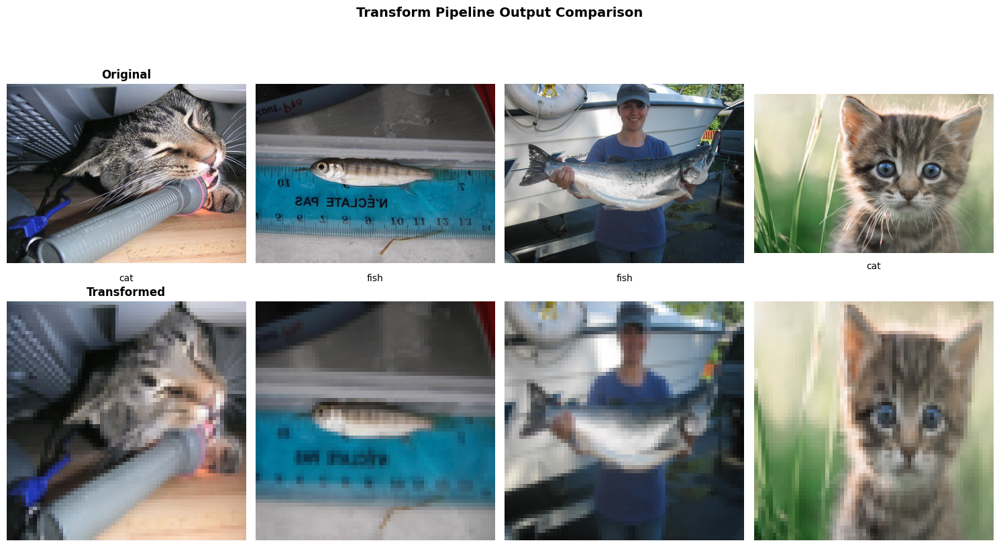


Transform Pipeline:
--------------------------------------------------
1. Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=True)
2. ToTensor()
3. Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
--------------------------------------------------


In [16]:
# Example 1: Visualize your current transform pipeline
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

# Create a dataset without transforms to get raw images
raw_dataset = datasets.ImageFolder(root=config.train_path)

# Display the transform output
display_transform_output(raw_dataset, transform, num_images=4)

Data Augmentation Pipeline:


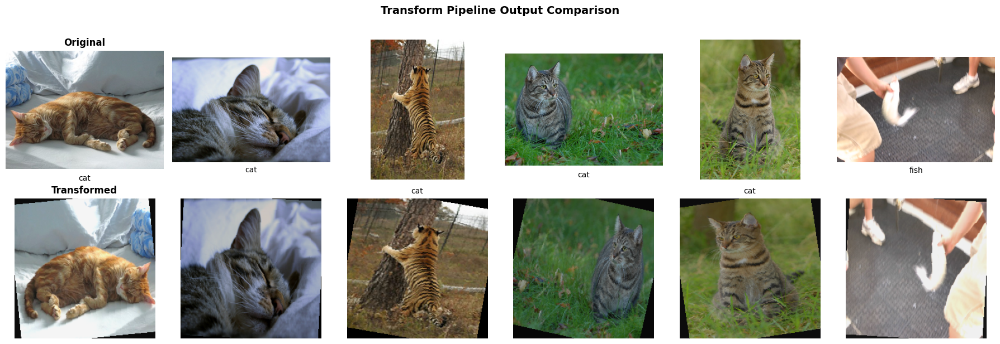


Transform Pipeline:
--------------------------------------------------
1. Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
2. RandomHorizontalFlip(p=0.5)
3. RandomRotation(degrees=[-15.0, 15.0], interpolation=nearest, expand=False, fill=0)
4. ColorJitter(brightness=(0.8, 1.2), contrast=(0.8, 1.2), saturation=(0.8, 1.2), hue=None)
5. ToTensor()
6. Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
--------------------------------------------------


In [17]:
# Example 2: Test data augmentation transforms
augmentation_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

print("Data Augmentation Pipeline:")
display_transform_output(raw_dataset, augmentation_transform, num_images=6, figsize=(18, 6))

Data Augmentation Pipeline with RandomResizedCrop:


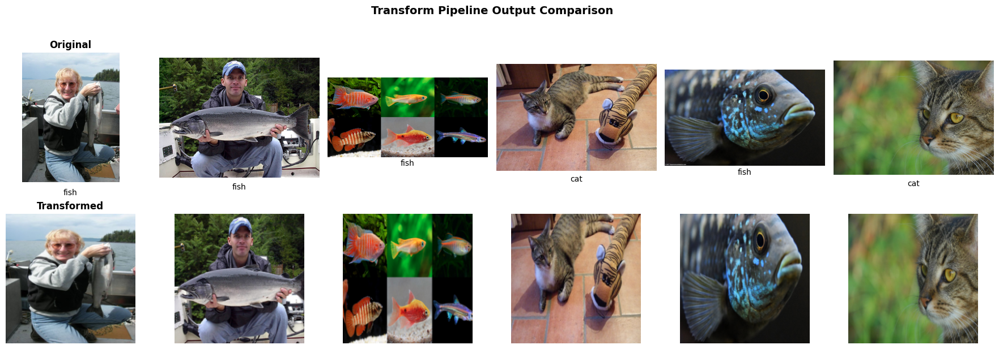


Transform Pipeline:
--------------------------------------------------
1. Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
2. RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), ratio=(0.75, 1.3333), interpolation=bilinear, antialias=True)
3. ToTensor()
4. Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
--------------------------------------------------


In [18]:
# try crop and randomresize crop
augmentation_transform_3 = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

print("Data Augmentation Pipeline with RandomResizedCrop:")
display_transform_output(raw_dataset, augmentation_transform_3, num_images=6, figsize=(18, 6))

### Padding

Pad is a general purpose padding transform that adds padding (extra height and width) onto the borders of an image

Data Augmentation Pipeline with Padding:


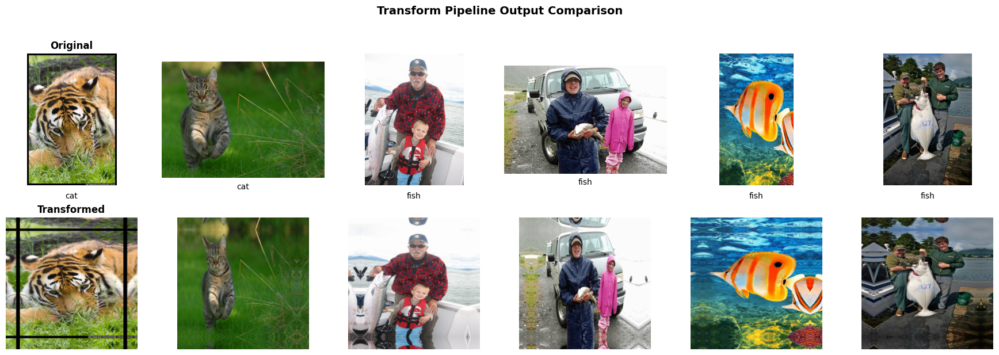


Transform Pipeline:
--------------------------------------------------
1. Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
2. Pad(padding=25, fill=0, padding_mode=reflect)
3. ToTensor()
4. Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
--------------------------------------------------


In [20]:
# try out padding
augmentation_transform_4 = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Pad(padding=25, fill=0, padding_mode='reflect'),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

print("Data Augmentation Pipeline with Padding:")
display_transform_output(raw_dataset, augmentation_transform_4, num_images=6, figsize=(18, 6))

### Random Affine

`RandomAffine` allows you to specify random affine transformations of the image (scaling, rotations, translations, and/or shearing, or any combination)

Data Augmentation Pipeline with RandomAffine:


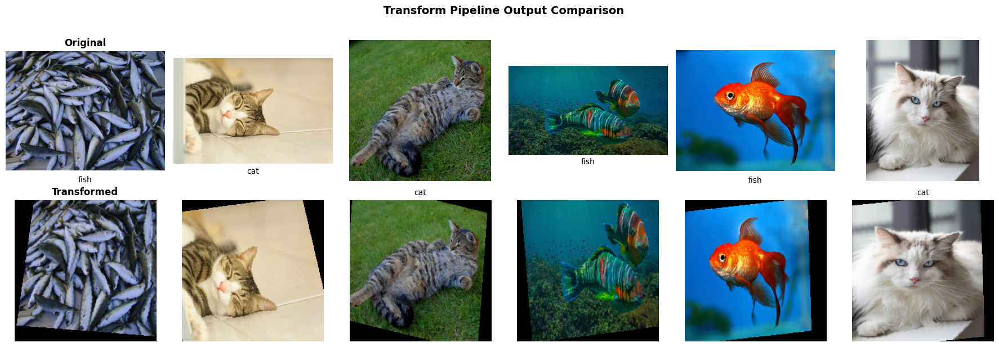


Transform Pipeline:
--------------------------------------------------
1. Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
2. RandomAffine(degrees=[-15.0, 15.0], translate=(0.1, 0.1), scale=(0.9, 1.1), shear=[-10.0, 10.0])
3. ToTensor()
4. Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
--------------------------------------------------


In [21]:
augmentation_transform_5 = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

print("Data Augmentation Pipeline with RandomAffine:")
display_transform_output(raw_dataset, augmentation_transform_5, num_images=6, figsize=(18, 6))

### Color Spaces and Lambda Transforms

Color spaces other than RGB are also available. A popular alternative is HSV (Hue, Saturation, Value). Some research suggests that this can produce slightly higher accuracy than RGB. Sometimes these colorspaces are trained in ensembles. 

You can use `image.convert` using a custom `transform` class to carry out this, but pytorch adds a `transform.Lambda` class tso that we can easily wrap any function and make it available to the transform pipeline. Here's our custom fucntion.

Data Augmentation Pipeline with Color Space Transformation (RGB to HSV):


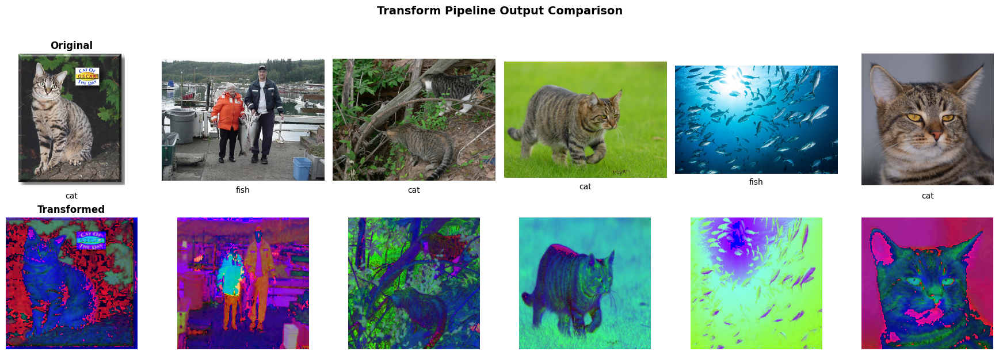


Transform Pipeline:
--------------------------------------------------
1. Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
2. Lambda()
3. ToTensor()
4. Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
--------------------------------------------------


In [22]:
from torchvision.transforms import functional as F
from torchvision.transforms import Lambda


def _random_color_space(x):
    output = x.convert("HSV")
    return output

color_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Lambda(_random_color_space),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

print("Data Augmentation Pipeline with Color Space Transformation (RGB to HSV):")
display_transform_output(raw_dataset, color_transform, num_images=6, figsize=(18, 6))

### Custom Transform classes

Sometimes we may have an initialization or state that we wan tto  keep track of. In these cases we can creaste a custom transform that oeprates on either PIL image data or a tensor. 

such a class has to implement two methods:

        __call__, which the transform pipeline will invoke during the transformatiuon process;

        __repr__, which should return a string representation of the transform, along iwth any state that may be useful for diagnostic purposes.

In [27]:
# custom transform to add gaussian noise
class Noise():
    """ adds gaussian noise to a tensor"""

    def __init__(self, mean, stddev):
        self.mean = mean
        self.stddev = stddev

    def __call__(self, tensor):
        noise = torch.zeros_like(tensor).normal_(self.mean, self.stddev)
        return tensor.add_(noise)
    
    def __repr__(self):
        repr = f"{self.__class__.__name__}(mean={self.mean}, stddev={self.stddev})"
        return repr
    
# Example usage
noise_transform = transforms.Compose([
    transforms.ToTensor(),
    Noise(0.1, 0.05)
])

If we add this to a pipeline, we can see the results of the __repr__ method being called:

Data Augmentation Pipeline with Gaussian Noise:


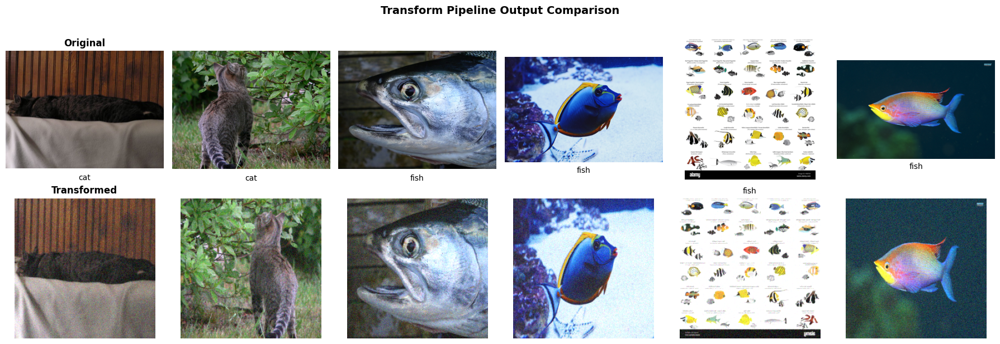


Transform Pipeline:
--------------------------------------------------
1. Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
2. RandomHorizontalFlip(p=0.5)
3. ToTensor()
4. Noise(mean=0.1, stddev=0.05)
5. Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
--------------------------------------------------


In [28]:
# insert the noise transform into a pipeline
augmentation_transform_6 = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    Noise(0.1, 0.05),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

print("Data Augmentation Pipeline with Gaussian Noise:")
display_transform_output(raw_dataset, augmentation_transform_6, num_images=6, figsize=(18, 6))